In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


# Download the dataset from kaggle
Link: https://www.kaggle.com/datasets/splcher/animefacedataset

In [2]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = '/content/drive/MyDrive/kaggle'

In [3]:
!kaggle datasets download -d splcher/animefacedataset

100% 393M/395M [00:13<00:00, 32.2MB/s]
100% 395M/395M [00:13<00:00, 29.6MB/s]


In [4]:
%load_ext tensorboard

In [5]:

import zipfile

file_path = '/content/animefacedataset.zip'

with zipfile.ZipFile(file_path, 'r') as zip_ref:
    zip_ref.extractall('/content/animefacedataset/')

# Import the libraries

In [6]:
import matplotlib.pyplot as plt
from PIL import Image
from keras.preprocessing.image import load_img, img_to_array

In [7]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter

#Load the data and plot some images

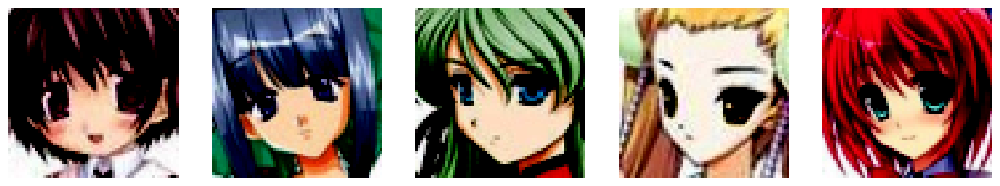

In [8]:
filename='/content/animefacedataset/images'
images=[]
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
])

for i in os.listdir(filename):
    img_path = os.path.join(filename, i)
    img = Image.open(img_path)
    img = transform(img)
    images.append(img)
fig, axes = plt.subplots(1, 5, figsize=(15, 3))
for i in range(5):
    axes[i].imshow(images[i].permute(1, 2, 0))
    axes[i].axis('off')
plt.show()

# Generator Model

In [9]:
class Generator(nn.Module):
  def __init__(self, channels_noise, channels_img, features_g):
    super(Generator, self).__init__()
    self.gen=nn.Sequential(
        self._block(channels_noise, features_g * 16, 4, 1, 0),
            self._block(features_g * 16, features_g * 8, 4, 2, 1),
            self._block(features_g * 8, features_g * 4, 4, 2, 1),
            self._block(features_g * 4, features_g * 2, 4, 2, 1),
            nn.ConvTranspose2d(
                features_g * 2, channels_img, kernel_size=4, stride=2, padding=1
            ),

            nn.Tanh(),
    )
  def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=False,
            ),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
        )
  def forward(self, x):
        return self.gen(x)

# Discriminator Model

In [10]:
class Discriminator(nn.Module):
    def __init__(self, channels_img, features_d):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            nn.Conv2d(channels_img, features_d, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            self._block(features_d, features_d * 2, 4, 2, 1),
            self._block(features_d * 2, features_d * 4, 4, 2, 1),
            self._block(features_d * 4, features_d * 8, 4, 2, 1),
            nn.Conv2d(features_d * 8, 1, kernel_size=4, stride=2, padding=0),
            nn.Sigmoid(),
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=False,
            ),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        return self.disc(x)

In [11]:
def initialize_weights(model):
    for m in model.modules():
        if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
            nn.init.normal_(m.weight.data, 0.0, 0.02)


# Inititialize Hyperparameters

In [12]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
LEARNING_RATE = 2e-4
BATCH_SIZE = 128
IMAGE_SIZE = 64
CHANNELS_IMG = 3
NOISE_DIM = 100
NUM_EPOCHS = 5
FEATURES_DISC = 64
FEATURES_GEN = 64


In [13]:
gen = Generator(NOISE_DIM, CHANNELS_IMG, FEATURES_GEN).to(device)
disc = Discriminator(CHANNELS_IMG, FEATURES_DISC).to(device)
initialize_weights(gen)
initialize_weights(disc)


In [14]:
opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
opt_disc = optim.Adam(disc.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
criterion = nn.BCELoss()

In [15]:
fixed_noise = torch.randn(32, NOISE_DIM, 1, 1).to(device)
writer_real = SummaryWriter(f"logs/real")
writer_fake = SummaryWriter(f"logs/fake")


gen.train()
disc.train()

Discriminator(
  (disc): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2)
    (2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (3): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (4): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (5): Conv2d(512, 1, kernel_size=(4, 4), stride=(2, 2))
    (6): Sigmoid()
  )
)

# Generate some Images
The generated images can be seen on the tensorboard

In [19]:
%tensorboard --logdir logs/
step = 0
for epoch in range(NUM_EPOCHS):
  for idx in range(0, len(images), BATCH_SIZE):

    real_batch = torch.stack(images[idx:idx + BATCH_SIZE]).to(device)

    noise = torch.randn(BATCH_SIZE, NOISE_DIM, 1, 1).to(device)
    fake = gen(noise)
    disc_real = disc(real_batch).reshape(-1)
    loss_disc_real = criterion(disc_real, torch.ones_like(disc_real))
    disc_fake = disc(fake.detach()).reshape(-1)
    loss_disc_fake = criterion(disc_fake, torch.zeros_like(disc_fake))
    loss_disc = (loss_disc_real + loss_disc_fake) / 2
    disc.zero_grad()
    loss_disc.backward()
    opt_disc.step()

    output = disc(fake).reshape(-1)
    loss_gen = criterion(output, torch.ones_like(output))
    gen.zero_grad()
    loss_gen.backward()
    opt_gen.step()
    if torch.isnan(loss_disc) or torch.isnan(loss_gen):
      print("NaN loss encountered. Stopping training.")
      break
    if idx % 100 == 0:

            print(
                f"Epoch [{epoch}/{NUM_EPOCHS-1}] \
                  Loss D: {loss_disc:.4f}, loss G: {loss_gen:.4f}"
            )

            with torch.no_grad():
                fake = gen(fixed_noise)

                img_grid_real = torchvision.utils.make_grid(real_batch[:32], normalize=True)
                img_grid_fake = torchvision.utils.make_grid(fake[:32], normalize=True)

                writer_real.add_image("Real", img_grid_real, global_step=step)
                writer_fake.add_image("Fake", img_grid_fake, global_step=step)

            step += 1

Reusing TensorBoard on port 6006 (pid 3097), started 0:28:33 ago. (Use '!kill 3097' to kill it.)

<IPython.core.display.Javascript object>

Epoch [0/4]                   Loss D: 0.3775, loss G: 2.9993
Epoch [0/4]                   Loss D: 0.4066, loss G: 3.1894
Epoch [0/4]                   Loss D: 0.4388, loss G: 3.0395
Epoch [0/4]                   Loss D: 0.4677, loss G: 3.5190
Epoch [0/4]                   Loss D: 0.6616, loss G: 1.7993
Epoch [0/4]                   Loss D: 0.3825, loss G: 2.5872
Epoch [0/4]                   Loss D: 0.3409, loss G: 2.6234
Epoch [0/4]                   Loss D: 0.3503, loss G: 2.8414
Epoch [0/4]                   Loss D: 0.3616, loss G: 2.7717
Epoch [0/4]                   Loss D: 0.4439, loss G: 2.4346
Epoch [0/4]                   Loss D: 0.2246, loss G: 3.4593
Epoch [0/4]                   Loss D: 0.5398, loss G: 5.2873
Epoch [0/4]                   Loss D: 0.5146, loss G: 3.6975
Epoch [0/4]                   Loss D: 0.3409, loss G: 2.5167
Epoch [0/4]                   Loss D: 0.2649, loss G: 3.6736
Epoch [0/4]                   Loss D: 0.3073, loss G: 2.9851
Epoch [0/4]             

In [25]:

torchvision.utils.save_image(fake[:32], "logs/fake/sample.png", normalize=True)
torchvision.utils.save_image(real_batch[:32], "logs/real/sample.png", normalize=True)

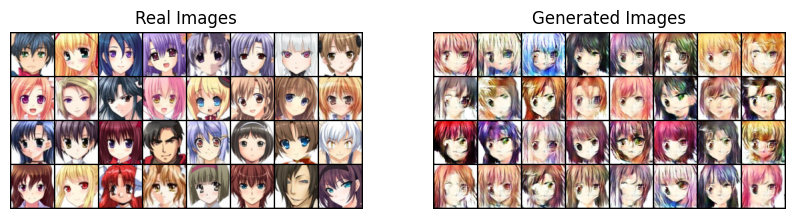

In [26]:
fake_image = Image.open("logs/fake/sample.png")
real_image = Image.open("logs/real/sample.png")

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(real_image)
plt.title("Real Images")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(fake_image)
plt.title("Generated Images")
plt.axis('off')

plt.show()